# Data Preparation

Pipeline:

1. Data Profiling and Data Quality Assessment
2. Data Cleaning
  * Data Transformation/Standardization (bringing everything to the same format, detecting and correcting typos,
performing wrangling operations, etc.)
  * Error Detection and Correction (dealing with missing values and the detection and correction of potential
outliers)
  * Data Deduplication (detecting and handling non-exact duplicates)
  
N.B. After cleaning the data, verify the desired quality level has been achieved (additional Data Quality Assessment —
brief)



# Environment set up
 Import and install the used libraries

## Mount drive

In [ ]:
import sys
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

# --- 1. ENVIRONMENT DETECTION & CONFIGURATION ---
try:
    import google.colab
    IN_COLAB = True
except ImportError:
    IN_COLAB = False

if IN_COLAB:
    print("☁️ Environment detected: Google Colab")

    # Silent installation of dependencies (-q) to keep the notebook clean
    print("⚙️ Installing dependencies...")
    !sudo apt-get install -y -q libcairo2-dev pkg-config python3-dev
    !{sys.executable} -m pip install -q -U ydata-profiling[notebook] recordlinkage jupyter-contrib-nbextensions astropy plotly
    !jupyter nbextension enable --py widgetsnbextension

    # DATA CONFIGURATION IN COLAB
    # Cloning from GitHub directly
    if not os.path.exists(DATA_PATH):
        !git clone https://github.com/ABADIAb/moma-artwork-data-quality-pipeline.git
        DATA_PATH = 'moma-artwork-data-quality-pipeline/data'

else:
    print("💻 Environment detected: Local")
    # We are running from 'notebooks/', so data is one level up (..)
    DATA_PATH = '../data'

☁️ Environment detected: Google Colab
⚙️ Installing dependencies...
Reading package lists...
Building dependency tree...
Reading state information...
libcairo2-dev is already the newest version (1.16.0-5ubuntu2).
The following packages were automatically installed and are no longer required:
  libbz2-dev libpkgconf3 libreadline-dev
Use 'sudo apt autoremove' to remove them.
The following additional packages will be installed:
  javascript-common libjs-sphinxdoc libjs-underscore python3.10-dev
Suggested packages:
  apache2 | lighttpd | httpd
The following packages will be REMOVED:
  pkgconf r-base-dev
The following NEW packages will be installed:
  javascript-common libjs-sphinxdoc libjs-underscore pkg-config python3-dev
  python3.10-dev
0 upgraded, 6 newly installed, 2 to remove and 41 not upgraded.
Need to get 508 kB/844 kB of archives.
After this operation, 1,253 kB of additional disk space will be used.
Ign:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 python3.10-dev am

## Import libraries

In [ ]:
# --- 2. SPECIFIC LIBRARY IMPORTS ---
# Imported here to avoid errors if they were not installed in step 1
try:
    from ydata_profiling import ProfileReport
    import recordlinkage
    from sklearn.neighbors import LocalOutlierFactor
    from astropy.time import Time
    import plotly
except ImportError as e:
    print(f"⚠️ Missing library: {e}. Remember to install requirements.txt locally.")

# Data Loading and Config
We import both datasets even if we are focusing on cleaning the artwork dataset since the artists dataset may be helpful.

In [ ]:
# --- 3. GLOBAL CONFIGURATION ---
np.random.seed(0)
pd.set_option('display.max_columns', None) # Optional: Useful to see all dataframe columns

# Define file paths
artworks_path = os.path.join(DATA_PATH, 'artworks.csv')
artists_path = os.path.join(DATA_PATH, 'artists.csv')

# Safety Validation
if os.path.exists(artworks_path) and os.path.exists(artists_path):
    print(f"✅ Data files found at: {DATA_PATH}")
else:
    print(f"❌ ERROR: CSV files not found at: {DATA_PATH}")
    print("   -> Verify that the 'data' folder exists and contains the files.")

✅ Data files found at: /content/drive/MyDrive/DataQualityTemporal/data


In [ ]:
# Import the artworks dataset  We can see that values like (not assigned) or Unidentified could count as NaN
missing_values_format = []
df_artwork = pd.read_csv(artworks_path, na_values=missing_values_format)
df_artwork.head()

,Artwork ID,Title,Artist ID,Name,Date,Medium,Dimensions,Acquisition Date,Credit,Catalogue,Department,Classification,Object Number,Diameter (cm),Circumference (cm),Height (cm),Length (cm),Width (cm),Depth (cm),Weight (kg),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",6210,Otto Wagner,1896,Ink and cut-and-pasted painted pages on paper,"19 1/8 x 66 1/2"" (48.6 x 168.9 cm)",1996-04-09,Fractional and promised gift of Jo Carole and ...,Y,Architecture & Design,Architecture,885.1996,NaN,NaN,48.6000,NaN,168.9000,NaN,NaN,NaN
1,3,"City of Music, National Superior Conservatory ...",7470,Christian de Portzamparc,1987,Paint and colored pencil on print,"16 x 11 3/4"" (40.6 x 29.8 cm)",1995-01-17,Gift of the architect in honor of Lily Auchinc...,Y,Architecture & Design,Architecture,1.1995,NaN,NaN,40.6401,NaN,29.8451,NaN,NaN,NaN
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",7605,Emil Hoppe,1903,"Graphite, pen, color pencil, ink, and gouache ...","13 1/2 x 12 1/2"" (34.3 x 31.8 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,Y,Architecture & Design,Architecture,1.1997,NaN,NaN,34.3000,NaN,31.8000,NaN,NaN,NaN
3,5,"The Manhattan Transcripts Project, New York, N...",7056,Bernard Tschumi,1980,Photographic reproduction with colored synthet...,"20 x 20"" (50.8 x 50.8 cm)",1995-01-17,Purchase and partial gift of the architect in ...,Y,Architecture & Design,Architecture,2.1995,NaN,NaN,50.8000,NaN,50.8000,NaN,NaN,NaN
4,6,"Villa, project, outside Vienna, Austria, Exter...",7605,Emil Hoppe,1903,"Graphite, color pencil, ink, and gouache on tr...","15 1/8 x 7 1/2"" (38.4 x 19.1 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,Y,Architecture & Design,Architecture,2.1997,NaN,NaN,38.4000,NaN,19.1000,NaN,NaN,NaN


In [ ]:
# Import the artists dataset
missing_values_format = []
df_artists = pd.read_csv(artists_path, na_values=missing_values_format)
df_artists.head()

,Artist ID,Name,Nationality,Gender,Birth Year,Death Year
0,1,Robert Arneson,American,Male,1930.0,1992.0
1,2,Doroteo Arnaiz,Spanish,Male,1936.0,NaN
2,3,Bill Arnold,American,Male,1941.0,NaN
3,4,Charles Arnoldi,American,Male,1946.0,NaN
4,5,Per Arnoldi,Danish,Male,1941.0,NaN


# Data Profiling and Data Quality Assessment
After importing the data, we get familiar with it, understanding the different columns, the different values and potential problems.

## Data Profiling and Exploration

In [ ]:
# Inspect the artwork dataset
print(df_artwork.info(), '\n')

# Inspect the artists dataset
print(df_artists.info(), '\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130262 entries, 0 to 130261
Data columns (total 21 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Artwork ID          130262 non-null  int64  
 1   Title               130200 non-null  object 
 2   Artist ID           128802 non-null  object 
 3   Name                128802 non-null  object 
 4   Date                127950 non-null  object 
 5   Medium              118343 non-null  object 
 6   Dimensions          118799 non-null  object 
 7   Acquisition Date    124799 non-null  object 
 8   Credit              127192 non-null  object 
 9   Catalogue           130262 non-null  object 
 10  Department          130262 non-null  object 
 11  Classification      130262 non-null  object 
 12  Object Number       130262 non-null  object 
 13  Diameter (cm)       1399 non-null    float64
 14  Circumference (cm)  10 non-null      float64
 15  Height (cm)         111893 non-nul

In [ ]:
df_artwork.describe()

,Artwork ID,Diameter (cm),Circumference (cm),Height (cm),Length (cm),Width (cm),Depth (cm),Weight (kg),Duration (s)
count,130262.000000,1399.000000,10.000000,111893.000000,736.000000,111003.000000,11443.000000,298.000000,3.084000e+03
mean,82501.371636,23.248939,44.868020,37.712992,89.117417,38.176838,18.291359,1248.278691,7.830060e+03
std,58124.331702,45.460079,28.631604,48.151347,329.717487,67.250118,57.703925,11856.456824,1.185046e+05
min,2.000000,0.635000,9.900000,0.000000,0.000000,0.000000,0.000000,0.090000,0.000000e+00
25%,34171.250000,7.900000,23.500000,18.100000,17.031875,17.800000,0.000000,5.443200,2.100000e+02
50%,69541.500000,13.700000,36.000000,27.940056,26.700000,25.400100,0.700000,19.051100,7.200000e+02
75%,128955.750000,24.782500,71.125000,44.450100,79.100000,44.800000,13.335013,65.318000,3.613250e+03
max,218011.000000,914.400000,83.800000,9140.000000,8321.056600,9144.000000,1808.483617,185067.585957,6.283065e+06


In [ ]:
# Inspect the unique values of each column
# We can see that values like (not assigned) or Unidentified could count as NaN
for column in df_artwork.columns:
  if df_artwork[column].dtype == 'object':
    print(column, df_artwork[column].unique())

Title ['Ferdinandsbrücke Project, Vienna, Austria, Elevation, preliminary version'
 'City of Music, National Superior Conservatory of Music and Dance, Paris, France, View from interior courtyard'
 'Villa near Vienna Project, Outside Vienna, Austria, Elevation' ...
 'Fluxphone Compositions' 'Unidentified' 'Portrait of Takako Saito']
Artist ID ['6210' '7470' '7605' ... '42821, 2928' '67694' '67695']
Name ['Otto Wagner' 'Christian de Portzamparc' 'Emil Hoppe' ...
 'Earl Brown, Ray Johnson' 'Glenn Williams' 'Ely Ramen']
Date ['1896' '1987' '1903' ... 'September 8, 1962' '1954–1956' '1955–1967']
Medium ['Ink and cut-and-pasted painted pages on paper'
 'Paint and colored pencil on print'
 'Graphite, pen, color pencil, ink, and gouache on tracing paper' ...
 'Casette' '2 cassettes and 1 DAT' 'Audio reel']
Dimensions ['19 1/8 x 66 1/2" (48.6 x 168.9 cm)' '16 x 11 3/4" (40.6 x 29.8 cm)'
 '13 1/2 x 12 1/2" (34.3 x 31.8 cm)' ... 'EST. 21 x 31 3/4"'
 'sheet (diameter): 7 7/8" (20 cm)'
 'image: 7 1

We use the ProfileReport to have a more visual representation of the data

In [ ]:
profile = ProfileReport(df_artwork, title='Artwork Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Exploration of edge cases
There's a lot of tuples with different values and formates like Dates, Dimensions, Medium, etc. We can explore a bit more in depth these problematic columns

In [ ]:
df_artwork[df_artwork['Department'] == 'Film']

,Artwork ID,Title,Artist ID,Name,Date,Medium,Dimensions,Acquisition Date,Credit,Catalogue,...,Classification,Object Number,Diameter (cm),Circumference (cm),Height (cm),Length (cm),Width (cm),Depth (cm),Weight (kg),Duration (s)
81138,89256,"Screen Tests: ""Baby"" Jane Holzer, Isabel Ebers...",6246,Andy Warhol,1963-1968,"16mm film (black and white, silent)",approx. 4:30 min. per test,NaN,NaN,N,...,Film,F20,NaN,NaN,NaN,NaN,NaN,NaN,NaN,270.0
81142,89260,The Text of Light,26608,Stan Brakhage,1974,"16mm film (color, silent)",68 min.,NaN,Purchase funds provided by The Jerome Foundation,Y,...,Film,483,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4080.0
81148,89283,Meshes of the Afternoon,6912,Maya Deren,1943,"16mm film (black and white, silent)",14 min.,1956-04-27,Acquired from the Artist,Y,...,Film,2001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,840.0
81149,89284,Steamboat Willie,"26612, 41932","Walt Disney, Ub Iwerks",1928,"35mm film (black and white, sound)",8 min.,1935-01-01,Acquired from The Walt Disney Corp.,Y,...,Film,2768,NaN,NaN,NaN,NaN,NaN,NaN,NaN,480.0
81150,89286,Potemkin (Bronenosets Potemkin),1708,Sergei Eisenstein,1925,"35mm film (black and white and hand-colored, s...",75 min.,1938-01-01,Acquired from Reichsfilmarchiv,Y,...,Film,933,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4500.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130211,217836,WMEN,49722,Esther Regelson,1981,"16mm film (black and white, sound)",NaN,2016-05,Gift of the filmmaker,N,...,Film,819137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
130212,217842,Club 57 Shows: Lady Wrestling,NaN,NaN,1980,Video,NaN,2016-10,Gift of Barry Shils,N,...,Video,819140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
130213,217843,Club 57 Shows: Lawrence Welk,NaN,NaN,1980,Video,NaN,2016-10,Gift of Barry Shils,N,...,Video,819141,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
130214,217844,Club 57 Shows: Playboy Bunny Night (at Mudd Club),NaN,NaN,1980,Video,NaN,2016-10,Gift of Barry Shils,N,...,Video,819142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_artwork[df_artwork['Classification'] == '(not assigned)']

,Artwork ID,Title,Artist ID,Name,Date,Medium,Dimensions,Acquisition Date,Credit,Catalogue,...,Classification,Object Number,Diameter (cm),Circumference (cm),Height (cm),Length (cm),Width (cm),Depth (cm),Weight (kg),Duration (s)
96563,127137,-,NaN,NaN,NaN,NaN,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,N,...,(not assigned),FC-Template,NaN,NaN,0.0,NaN,0.0,0.0,NaN,NaN
97658,128896,Picasso Dessins,4609,Pablo Picasso,1926,Illustrated book,NaN,NaN,The Louis E. Stern Collection,N,...,(not assigned),965.1964.1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98093,130504,Untitled,NaN,NaN,NaN,(CONFIRM),NaN,2008-10-08,NaN,N,...,(not assigned),2901.2008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98380,131022,Drawing Restraint Archive,7005,Matthew Barney,1987-,Various mediums,NaN,2010-03-08,"Jointly owned by Laurenz Foundation, Schaulage...",Y,...,(not assigned),77.201,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98547,131303,Shadow Piece II,5403,Mieko Shiomi,1964,NaN,"Box: 4 3/4 x 4 x 7/8"" (12 x 10.2 x 2.3 cm)",2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,N,...,(not assigned),FC1031,NaN,NaN,12.0,NaN,10.2,2.3,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125213,195796,Drawer,21398,George Maciunas,NaN,Empty drawer,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,N,...,(not assigned),FSC3564.2008.30,NaN,NaN,0.0,NaN,0.0,0.0,NaN,NaN
126294,199233,The Black Factory Archive: Digital Files and w...,37145,William Pope.L,2014,Mac Mini,NaN,2014-10-20,NaN,N,...,(not assigned),TR15010.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
127971,201929,The Black Factory Archive: SUM Film,37145,William Pope.L,2014,Blue Ray,NaN,2014-10-20,NaN,N,...,(not assigned),TR15010.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
129522,215627,The Black Factory Archive: Soap Bars,37145,William Pope.L,2014,Four soap boxes,NaN,NaN,NaN,N,...,(not assigned),TR15010.54.a-d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# There's ~4000 rows that have multiple artists
df_not_null = df_artwork[df_artwork['Artist ID'].notnull()]
df_not_null[df_not_null['Artist ID'].str.contains(',')]

,Artwork ID,Title,Artist ID,Name,Date,Medium,Dimensions,Acquisition Date,Credit,Catalogue,...,Classification,Object Number,Diameter (cm),Circumference (cm),Height (cm),Length (cm),Width (cm),Depth (cm),Weight (kg),Duration (s)
65,81,"House IV Transformation Study, project, Falls ...","6969, 8134","Peter Eisenman, Robert Cole",1975,Ink and color ink on frosted polymer sheet,"13 3/4 x 44 5/8"" (34.9 x 113.3 cm)",1980-01-08,Gift of Philip Johnson,Y,...,Architecture,20.198,NaN,NaN,34.9251,NaN,113.3477,NaN,NaN,NaN
66,82,"Villa dall'Ava, Paris (Saint-Cloud), France, E...","6956, 6957","Rem Koolhaas, Madelon Vriesendorp",1987,Synthetic polymer paint and ink on paper,"25 x 39"" (63.5 x 99.1 cm)",2000-01-19,Gift of Max Underwood,Y,...,Architecture,21.2,NaN,NaN,63.5001,NaN,99.0602,NaN,NaN,NaN
76,100,"Regional Administrative Center, project ""Tries...","7661, 8131, 8180","Aldo Rossi, Gianni Braghieri, M. Bosshard",1974,Rubbed ink and pastel on whiteprint,"28 1/2 x 36"" (72.4 x 91.4 cm)",1980-01-08,Philip Johnson Fund,Y,...,Architecture,28.198,NaN,NaN,72.4000,NaN,91.4000,NaN,NaN,NaN
107,148,"Woodland Crematorium, Woodland Cemetery, Stock...","27, 24452","Erik Gunnar Asplund, Sigurd Lewerentz",1937,Graphite on tracing paper,"16 1/4 x 37 7/8"" (41.3 x 96.2 cm)",1990-01-17,"Gift of Blanchette Hooker Rockefeller, Mrs. Gi...",Y,...,Architecture,62.199,NaN,NaN,41.3000,NaN,96.2000,NaN,NaN,NaN
110,151,"Palais de la Découverte Project, Paris, France...","8102, 6703, 4312","Paul Nelson, Frantz Jourdain, Oscar Nitzchke",1938,Ink and color pencil on paper mounted on board,"14 3/4 x 37 1/2 x 1/2"" (37.5 x 95.3 x 1.3 cm)",1966-01-01,Gift of the architects,Y,...,Architecture,98.2013,NaN,NaN,37.5000,NaN,95.3000,1.3,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130133,216775,Dear Data,"67122, 39150","Giorgia Lupi, Stefanie Posavec",2015,Hand-illustrated postcards,NaN,2016-10-17,Committee on Architecture and Design Funds,N,...,Design,962.2016.50a-b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
130134,216776,Dear Data,"67122, 39150","Giorgia Lupi, Stefanie Posavec",2015,Hand-illustrated postcards,NaN,2016-10-17,Committee on Architecture and Design Funds,N,...,Design,962.2016.51a-b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
130135,216777,Dear Data,"67122, 39150","Giorgia Lupi, Stefanie Posavec",2015,Hand-illustrated postcards,NaN,2016-10-17,Committee on Architecture and Design Funds,N,...,Design,962.2016.52a-b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
130239,217965,Misc performances 1959-1960,"2637, 30644","Dick Higgins, Al Hansen",NaN,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,N,...,Media,FC5020,NaN,NaN,0.0000,NaN,0.0000,0.0,NaN,NaN


We know that eventually we would have to perform data analysis so we can explore potential target variables for our pipeline and find columns that are well balanced and don't have a lot of missing values (in order to train)

In [ ]:
# Department and catalogue are good candidates for our target variable
department = df_artwork['Department'].value_counts()
catalogue = df_artwork['Catalogue'].value_counts()

print(department, '\n')
print(catalogue, '\n')

Department
Prints & Illustrated Books               60128
Photography                              29161
Architecture & Design                    18269
Drawings                                 11027
Painting & Sculpture                      3806
Film                                      3088
Media and Performance Art                 2627
Fluxus Collection                         2135
Architecture & Design - Image Archive       21
Name: count, dtype: int64 

Catalogue
Y    71333
N    58929
Name: count, dtype: int64 



### Correlation
Correlation information could be useful for our data analysis

In [ ]:
numerical_columns = list(df_artwork.select_dtypes(include=['int64','float64']).columns)
df_numeric = df_artwork[numerical_columns]
df_numeric.corr(method ='pearson')

,Artwork ID,Diameter (cm),Circumference (cm),Height (cm),Length (cm),Width (cm),Depth (cm),Weight (kg),Duration (s)
Artwork ID,1.000000,0.111194,-0.728448,0.039335,-0.014387,0.042203,-0.190902,0.097561,-0.005265
Diameter (cm),0.111194,1.000000,0.997579,0.561972,0.912733,0.599688,0.328823,1.000000,NaN
Circumference (cm),-0.728448,0.997579,1.000000,0.998574,NaN,NaN,NaN,NaN,NaN
Height (cm),0.039335,0.561972,0.998574,1.000000,0.633806,0.411324,0.248510,0.181289,0.301602
Length (cm),-0.014387,0.912733,NaN,0.633806,1.000000,0.169485,0.754002,NaN,NaN
Width (cm),0.042203,0.599688,NaN,0.411324,0.169485,1.000000,0.448420,0.605502,0.801273
Depth (cm),-0.190902,0.328823,NaN,0.248510,0.754002,0.448420,1.000000,0.073792,-1.000000
Weight (kg),0.097561,1.000000,NaN,0.181289,NaN,0.605502,0.073792,1.000000,NaN
Duration (s),-0.005265,NaN,NaN,0.301602,NaN,0.801273,-1.000000,NaN,1.000000


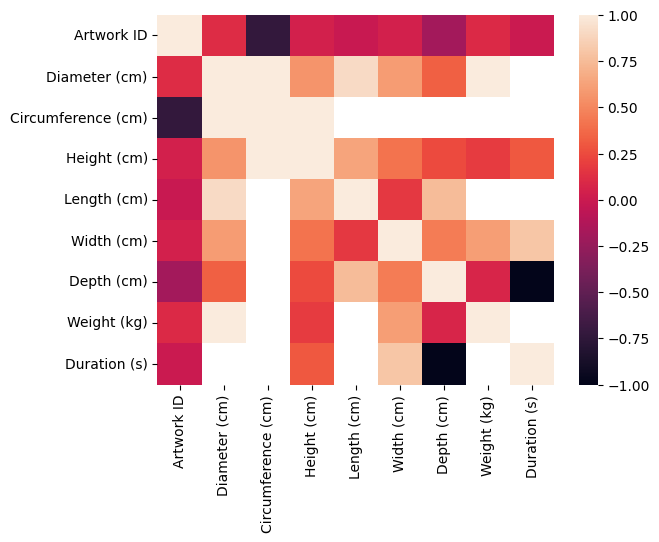

In [ ]:
correlation = df_numeric.corr(method ='pearson')
sns.heatmap(correlation)
plt.show()

## Data Quality Assessment
Now we proceed to perform a general data quality assessment such as uniqueness, completeness (per column) and then a more narrow assessment for certain columns such as accuracy and consistency.  

### General assessment

In [ ]:
uniqueness_artwork = {}
distinctness_artwork = {}
constancy_artwork = {}
completeness_artwork = {}

for column in df_artwork.columns:
    num_distinct = (df_artwork[column].nunique())
    count = df_artwork[column].count()
    rows = len(df_artwork[column])
    uniqueness = num_distinct / rows
    uniqueness_artwork[column] = uniqueness

    distinctness = num_distinct / count
    distinctness_artwork[column] = distinctness

    max_count = max(df_artwork[column].value_counts())
    constancy = max_count / count
    constancy_artwork[column] = constancy

    num_not_null = df_artwork[column].count()
    completeness = num_not_null / rows
    completeness_artwork[column] = completeness

# Create a data frame with the assessment for each column
df_artwork_quality = pd.DataFrame(columns=['Uniqueness', 'Distinctness', 'Constancy', 'Completeness'])
df_artwork_quality['Distinctness'] = distinctness_artwork.values()
df_artwork_quality['Constancy'] = constancy_artwork.values()
df_artwork_quality['Uniqueness'] = uniqueness_artwork.values()
df_artwork_quality['Completeness'] = completeness_artwork.values()
df_artwork_quality.index = distinctness_artwork.keys()
df_artwork_quality

,Uniqueness,Distinctness,Constancy,Completeness
Artwork ID,1.000000,1.000000,0.000008,1.000000
Title,0.728386,0.728733,0.055146,0.999524
Artist ID,0.104213,0.105394,0.039207,0.988792
Name,0.103868,0.105045,0.039207,0.988792
Date,0.071955,0.073255,0.013662,0.982251
Medium,0.148531,0.163491,0.119171,0.908500
Dimensions,0.602355,0.660477,0.007769,0.912000
Acquisition Date,0.014402,0.015032,0.089905,0.958061
Credit,0.053968,0.055271,0.085909,0.976432
Catalogue,0.000015,0.000015,0.547612,1.000000


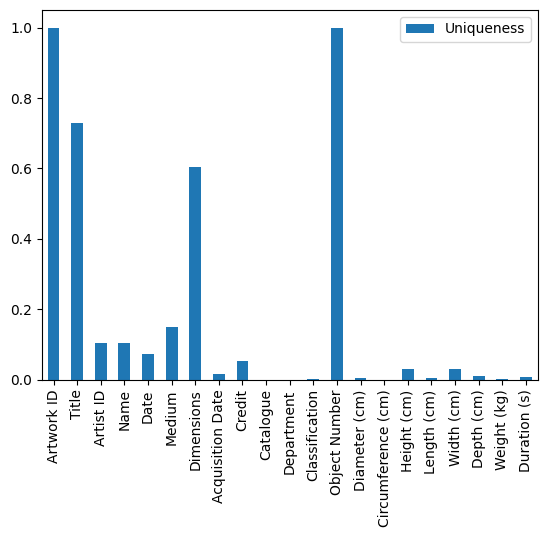

In [ ]:
from matplotlib import pyplot as plt
# Plot the uniqueness of each column
df_artwork_quality.plot(kind='bar', y='Uniqueness')
plt.show()

### Duplication

In [ ]:
# Check if there are duplicates
df_artwork.duplicated().any()

False

In [ ]:
# Investigate Title duplicates
duplicates = df_artwork[df_artwork['Title'].duplicated()]

#Group duplicates by title of the artwork
duplicates.groupby('Title').count()

,Artwork ID,Artist ID,Name,Date,Medium,Dimensions,Acquisition Date,Credit,Catalogue,Department,Classification,Object Number,Diameter (cm),Circumference (cm),Height (cm),Length (cm),Width (cm),Depth (cm),Weight (kg),Duration (s)
Title,,,,,,,,,,,,,,,,,,,,
!,1,1,1,1,1,1,1,1,1,1,1,1,0,0,1,0,1,0,0,0
"""1 MAN/1 PLACE"" from the portfolio DETAILS FROM THE EXCAVATION OF WOOSTER STREET",1,1,1,1,0,1,1,1,1,1,1,1,0,0,1,0,1,0,0,0
"""1 PERSON/1 PLACE"" from the portfolio DETAILS FROM THE EXCAVATION OF WOOSTER STREET",3,3,3,3,0,3,3,3,3,3,3,3,0,0,3,0,3,0,0,0
"""2 PEOPLE/1 PLACE"" from the portfolio DETAILS FROM THE EXCAVATION OF WOOSTER STREET",1,1,1,1,0,1,1,1,1,1,1,1,0,0,1,0,1,0,0,0
"""2 PEOPLE/2 PLACES"" from the portfolio DETAILS FROM THE EXCAVATION OF WOOSTER STREET",5,5,5,5,0,5,5,5,5,5,5,5,0,0,5,0,5,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Étampes. Maison de Diane de Poitiers,8,8,8,8,8,8,8,8,8,8,8,8,0,0,0,0,0,0,0,0
Étang de Corot,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0
"“INVOICE FOR THE PRINTING OF PROSPECTUS,”",1,1,1,1,1,0,1,1,1,1,1,1,0,0,0,0,0,0,0,0


In [ ]:
# Check if there are duplicates based on title
num_duplicates_title = df_artwork.duplicated(subset='Title').sum()
print("Percentage of duplicates based on title: ", num_duplicates_title / len(df_artwork))

Percentage of duplicates based on title:  0.2716064546836376


### Accuracy

Definition: The extent to which data are correct, reliable and certified.
Syntactic Accuracy is the closeness of a value v to the elements of the corresponding definition domain D.

We define the domain as the name of the artists included in the artists dataset.

Evaluation: Number of accurate values / Total number of values

In [ ]:
# Define rules like artists ID of artwork should be in the domain
artists_names_domain = df_artists['Name'].unique()

# Check if the artists names are included in the domain
num_out_of_domain = len(df_artwork[df_artwork['Name'].isin(artists_names_domain) == False])
accuracy_artists = 1 - (num_out_of_domain / len(df_artwork))
print("Accuracy of artists: ",  accuracy_artists)

Accuracy of artists:  0.9394374414641261


### Consistency

The consistency dimension captures the violation of semantic rules defined over (a set of) data items, where items can be tuples of relational tables or records in a file.

In this case, we asses the consistency of films and dates. For consistency, films should have a duration attribute in seconds, the acquisition date should be after the creation date of the piece of work and both the dates should be before the 01/01/2025 (date in which we assume that the database was created).  

Evaluation: Number of consistent tuples / Total number of tuples

#### Consistency of Films

In [ ]:
# Check if all films have a duration (s)
df_film = df_artwork[df_artwork['Classification'] == 'Film']

num_film = len(df_film)
num_has_duration = df_film['Duration (s)'].count()

consistency_films_with_duration = num_has_duration / num_film
print("Consistency of films having a duration: ",  consistency_films_with_duration)

Consistency of films having a duration:  0.5410122164048866


#### Consistency of Dates

In [ ]:
# Check if all acquisition dates are after the artwork date
df_dates = df_artwork[df_artwork['Date'].notnull()]

df_dates['Acquisition Year'] = df_dates['Acquisition Date'].str.split('-').str[0]
df_comparison = df_dates['Acquisition Year'] >= df_dates['Date']

print("Consistency of dates: ", df_comparison.sum() / df_dates['Date'].count())

Consistency of dates:  0.8692145369284877


<ipython-input-35-bcad321ba176>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates['Acquisition Year'] = df_dates['Acquisition Date'].str.split('-').str[0]


In [ ]:
#check if all acquisition dates are before the 2025
df_dates = df_artwork[df_artwork['Acquisition Date'].notnull()]

df_dates['Acquisition Year'] = df_dates['Acquisition Date'].str.split('-').str[0]
df_dates['Acquisition Year'] = pd.to_numeric(df_dates['Acquisition Year'], errors='coerce')
df_comparison = df_dates['Acquisition Year'] < 2025

print("Consistency of dates: ", df_comparison.sum() / df_dates['Acquisition Year'].count())


Consistency of dates:  1.0


<ipython-input-36-d8d454e6c0be>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates['Acquisition Year'] = df_dates['Acquisition Date'].str.split('-').str[0]
<ipython-input-36-d8d454e6c0be>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_dates['Acquisition Year'] = pd.to_numeric(df_dates['Acquisition Year'], errors='coerce')


# Data Cleaning
For our cleaning pipeline we first apply data transformations, detect errors and outliers in the data (and correct them if possible), and finally we correctly apply deduplication.

## Data Transformation (corrected)

In [ ]:
# Import the artworks dataset specifying format for missing values seen before
missing_values_format = ['(not assigned)',
                         'Unidentified',
                         '(n.d.)',
                         'n.d.',
                         'n. d.',
                         'n.d',
                         'no date',
                         'TBC',
                         'TBD',
                         'Unknown',
                         'unknown',
                         'Unkown', # added
                         'Various'] # added
df_artwork = pd.read_csv(artworks_path, na_values=missing_values_format)
df_artwork.head()

# Drop columns with tiny amount of non-null data i.e. circumference (10)
df_artwork = df_artwork.drop(columns=[
                            'Diameter (cm)',
                            'Depth (cm)',
                            'Circumference (cm)',
                            'Length (cm)',
                            'Weight (kg)'])

# Drop useless columns
df_artwork = df_artwork.drop(columns=['Object Number'])
df_artwork

,Artwork ID,Title,Artist ID,Name,Date,Medium,Dimensions,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",6210,Otto Wagner,1896,Ink and cut-and-pasted painted pages on paper,"19 1/8 x 66 1/2"" (48.6 x 168.9 cm)",1996-04-09,Fractional and promised gift of Jo Carole and ...,Y,Architecture & Design,Architecture,48.6000,168.9000,NaN
1,3,"City of Music, National Superior Conservatory ...",7470,Christian de Portzamparc,1987,Paint and colored pencil on print,"16 x 11 3/4"" (40.6 x 29.8 cm)",1995-01-17,Gift of the architect in honor of Lily Auchinc...,Y,Architecture & Design,Architecture,40.6401,29.8451,NaN
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",7605,Emil Hoppe,1903,"Graphite, pen, color pencil, ink, and gouache ...","13 1/2 x 12 1/2"" (34.3 x 31.8 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,Y,Architecture & Design,Architecture,34.3000,31.8000,NaN
3,5,"The Manhattan Transcripts Project, New York, N...",7056,Bernard Tschumi,1980,Photographic reproduction with colored synthet...,"20 x 20"" (50.8 x 50.8 cm)",1995-01-17,Purchase and partial gift of the architect in ...,Y,Architecture & Design,Architecture,50.8000,50.8000,NaN
4,6,"Villa, project, outside Vienna, Austria, Exter...",7605,Emil Hoppe,1903,"Graphite, color pencil, ink, and gouache on tr...","15 1/8 x 7 1/2"" (38.4 x 19.1 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,Y,Architecture & Design,Architecture,38.4000,19.1000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130257,217983,Seul/NY/MAX,4469,Nam June Paik,NaN,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,N,Fluxus Collection,Media,0.0000,0.0000,NaN
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,NaN,NaN,1962,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,N,Fluxus Collection,Media,0.0000,0.0000,NaN
130259,217985,Fluxphone Compositions,67695,Ely Ramen,1969,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,N,Fluxus Collection,Media,0.0000,0.0000,NaN
130260,217986,NaN,NaN,NaN,NaN,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,N,Fluxus Collection,Media,0.0000,0.0000,NaN


In [ ]:
df_artwork['Catalogue'] = df_artwork['Catalogue'].apply(lambda x: 1 if x == 'Y' else 0)
df_artwork

,Artwork ID,Title,Artist ID,Name,Date,Medium,Dimensions,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",6210,Otto Wagner,1896,Ink and cut-and-pasted painted pages on paper,"19 1/8 x 66 1/2"" (48.6 x 168.9 cm)",1996-04-09,Fractional and promised gift of Jo Carole and ...,1,Architecture & Design,Architecture,48.6000,168.9000,NaN
1,3,"City of Music, National Superior Conservatory ...",7470,Christian de Portzamparc,1987,Paint and colored pencil on print,"16 x 11 3/4"" (40.6 x 29.8 cm)",1995-01-17,Gift of the architect in honor of Lily Auchinc...,1,Architecture & Design,Architecture,40.6401,29.8451,NaN
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",7605,Emil Hoppe,1903,"Graphite, pen, color pencil, ink, and gouache ...","13 1/2 x 12 1/2"" (34.3 x 31.8 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture & Design,Architecture,34.3000,31.8000,NaN
3,5,"The Manhattan Transcripts Project, New York, N...",7056,Bernard Tschumi,1980,Photographic reproduction with colored synthet...,"20 x 20"" (50.8 x 50.8 cm)",1995-01-17,Purchase and partial gift of the architect in ...,1,Architecture & Design,Architecture,50.8000,50.8000,NaN
4,6,"Villa, project, outside Vienna, Austria, Exter...",7605,Emil Hoppe,1903,"Graphite, color pencil, ink, and gouache on tr...","15 1/8 x 7 1/2"" (38.4 x 19.1 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture & Design,Architecture,38.4000,19.1000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130257,217983,Seul/NY/MAX,4469,Nam June Paik,NaN,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,NaN,NaN,1962,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130259,217985,Fluxphone Compositions,67695,Ely Ramen,1969,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130260,217986,NaN,NaN,NaN,NaN,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN


In [ ]:
df_artwork['Department'].unique()

array(['Architecture & Design', 'Prints & Illustrated Books', 'Drawings',
       'Painting & Sculpture', 'Photography', 'Media and Performance Art',
       'Film', 'Architecture & Design - Image Archive',
       'Fluxus Collection'], dtype=object)

In [ ]:
# Transform the department column to have the same format
df_artwork.loc[df_artwork['Department'] == 'Architecture & Design - Image Archive', 'Department'] = 'Architecture and Design'
df_artwork.loc[df_artwork['Department'] == 'Architecture & Design', 'Department'] = 'Architecture and Design'
df_artwork.loc[df_artwork['Department'] == 'Prints & Illustrated Books', 'Department'] = 'Prints and Illustrated Books'
df_artwork.loc[df_artwork['Department'] == 'Painting & Sculpture', 'Department'] = 'Painting and Sculpture'

In [ ]:
df_artwork['Classification'].unique()

array(['Architecture', 'Mies van der Rohe Archive', 'Design',
       'Illustrated Book', 'Print', 'Drawing', 'Film', 'Multiple',
       'Periodical', 'Photograph', 'Painting', 'Product Design',
       'Photography Research/Reference', 'Media', 'Sculpture', 'Textile',
       'Installation', 'Video', 'Work on Paper', 'Audio', 'Performance',
       nan, 'Film (object)', 'Ephemera', 'Collage',
       'Frank Lloyd Wright Archive', 'Furniture and Interiors',
       'Software'], dtype=object)

In [ ]:
df_artwork.loc[df_artwork['Classification'] == 'Film (object)', 'Classification'] = 'Film' #change from film object to just film
df_artwork.loc[df_artwork['Classification'] == 'Photography Research/Reference', 'Classification'] = 'Photography Research'

### Standardization of Date formats (Corrected)
Dates have different formats and some of them can be preprocessed to extract the relevant year

REMEMBER TO LOAD AGAIN THE DATASET

In [ ]:
df_artwork['Date'].unique()

array(['1896', '1987', '1903', ..., 'September 8, 1962', '1954–1956',
       '1955–1967'], dtype=object)

In [ ]:
def extract_years(date_str):
  try:
    # Ensure that the value is a string
    date_str = str(date_str)

    # Find all 4-digit years and remove chars
    years_long = [re.sub(r'\D', '', year) for year in re.findall(r"\b([a-zA-Z]+\d{4}|\d{4}|\d{4}s)\b", date_str)]
    if len(years_long) >= 2:  # If two or more years are found
      # Handle cases (e.g., "c. 1915-1917", "1870s-1880s", "(c. 1910s-1930s)")
      year1, year2 = years_long[0], years_long[-1]  # Take the first and the last
      if int(year1) > int(year2):
        year1, year2 = year2, year1
      return int(year1), int(year2)

    elif len(years_long) == 1:
      # Handle cases with a hyphen (e.g., "c. 1915-17", "1870s-80s", "(c. 1910s-30s)")
      year1 = years_long[0]

      # Find 2-digit years
      years_short = [re.sub(r'\D', '', year) for year in re.findall(r"\b(\d{2}|\d{2}s)\b", date_str)]

      # If has 1 year
      if len(years_short) == 0:
        return int(year1), int(year1)

      # If has 2 years
      year2 = year1[:2] + years_short[0]
      if int(year1) > int(year2):
        year1, year2 = year2, year1
      return int(year1), int(year2)

    elif len(years_long) == 0:
      # Find 1-digit years
      years_one = [str((int(re.sub(r'\D', '', year)) - 1) * 100) for year in re.findall(r"\b(\d{1}|\d{1}th)\b", date_str)]
      if len(years_one) >= 2:
        year1, year2 = years_one[0], years_one[-1]
        if int(year1) > int(year2):
          year1, year2 = year2, year1
        return int(year1), int(year2)

      elif len(years_one) == 1:
        year1 = years_one[0]
        return int(year1), int(year1)

      else:
        return None, None

  except Exception as e:
    print(f"Error processing '{date_str}': {e}")
    return None, None

  return None, None  # If no year is found

In [ ]:
# create a copy before the update, por si algo
df_artwork_copy = df_artwork.copy()

# Get the tuples where date is are not null
df_not_null = df_artwork[df_artwork['Date'].notnull()]

# Fix column Date
# Apply the function and create two new columns
df_not_null[['Start year', 'End year']] = df_not_null['Date'].apply(extract_years).apply(pd.Series)

<ipython-input-45-34758bf5e750>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_not_null[['Start year', 'End year']] = df_not_null['Date'].apply(extract_years).apply(pd.Series)
<ipython-input-45-34758bf5e750>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_not_null[['Start year', 'End year']] = df_not_null['Date'].apply(extract_years).apply(pd.Series)


In [ ]:
# Add new columns to the main dataframe and organize:

# Set the index to a common identifier (e.g., 'Artwork ID')
df_artwork = df_artwork.set_index('Artwork ID')
df_not_null = df_not_null.set_index('Artwork ID')

# Concatenate the DataFrames along columns, keeping only columns present in df_not_null
df_artwork = pd.concat([df_artwork, df_not_null[['Start year', 'End year']]], axis=1)

# Reset the index
df_artwork = df_artwork.reset_index()

# Organize new columns
original_position_date = df_artwork.columns.get_loc('Date')  # Get the column Date's position
df_artwork.insert(original_position_date, 'Start year', df_artwork.pop('Start year'))  # Re-insert 'Start date'
df_artwork.insert(original_position_date + 1, 'End year', df_artwork.pop('End year'))  # Re-insert 'End date'
df_artwork = df_artwork.drop('Date', axis=1) # Drop column Date

df_artwork

,Artwork ID,Title,Artist ID,Name,Start year,End year,Medium,Dimensions,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",6210,Otto Wagner,1896.0,1896.0,Ink and cut-and-pasted painted pages on paper,"19 1/8 x 66 1/2"" (48.6 x 168.9 cm)",1996-04-09,Fractional and promised gift of Jo Carole and ...,1,Architecture and Design,Architecture,48.6000,168.9000,NaN
1,3,"City of Music, National Superior Conservatory ...",7470,Christian de Portzamparc,1987.0,1987.0,Paint and colored pencil on print,"16 x 11 3/4"" (40.6 x 29.8 cm)",1995-01-17,Gift of the architect in honor of Lily Auchinc...,1,Architecture and Design,Architecture,40.6401,29.8451,NaN
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",7605,Emil Hoppe,1903.0,1903.0,"Graphite, pen, color pencil, ink, and gouache ...","13 1/2 x 12 1/2"" (34.3 x 31.8 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,34.3000,31.8000,NaN
3,5,"The Manhattan Transcripts Project, New York, N...",7056,Bernard Tschumi,1980.0,1980.0,Photographic reproduction with colored synthet...,"20 x 20"" (50.8 x 50.8 cm)",1995-01-17,Purchase and partial gift of the architect in ...,1,Architecture and Design,Architecture,50.8000,50.8000,NaN
4,6,"Villa, project, outside Vienna, Austria, Exter...",7605,Emil Hoppe,1903.0,1903.0,"Graphite, color pencil, ink, and gouache on tr...","15 1/8 x 7 1/2"" (38.4 x 19.1 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,38.4000,19.1000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130257,217983,Seul/NY/MAX,4469,Nam June Paik,NaN,NaN,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,NaN,NaN,1962.0,1962.0,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130259,217985,Fluxphone Compositions,67695,Ely Ramen,1969.0,1969.0,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130260,217986,NaN,NaN,NaN,NaN,NaN,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN


### Standardization of Acquisition Date formats (Corrected)
Also this column should have a specialized function to correct the values

In [ ]:
df_artwork['Acquisition Date'].unique()

array(['1996-04-09', '1995-01-17', '1997-01-15', ..., '1216-10-18',
       '2016-10', '2016-05'], dtype=object)

In [ ]:
def fix_acquisition_date(date_str):
  try:
    date_str = str(date_str)

    if re.match(r"\d{4}-\d{2}$", date_str):  # Match YYYY-MM format
      return date_str + "-01"  # Add "-01" for the day
    else:
      # If not YYYY-MM, try to extract a valid date using regex
      match = re.search(r"(\d{4})-(\d{2})-(\d{2})", date_str)
      if match:
        year, month, day = match.groups()
        return f"{year}-{month}-{day}"
      else:
        return date_str  # Return original if no valid date is found

  except Exception as e:
    print(f"Error processing '{date_str}': {e}")
    return None, None

  return None, None  # If no year is found

In [ ]:
# create a copy before the update, por si algo
df_artwork_copy = df_artwork.copy()

# Get the tuples where date is are not null
df_not_null = df_artwork[df_artwork['Acquisition Date'].notnull()]

# Fix column Acquisition Date
df_not_null[['Acquisition Date']] = df_not_null['Acquisition Date'].apply(fix_acquisition_date).apply(pd.Series)

# Check for remaining values with different format
different_format_dates = df_not_null[~df_not_null['Acquisition Date'].str.match(r"\d{4}-\d{2}-\d{2}")]

# Print the results
if different_format_dates.empty:
  print("All 'Acquisition date' values are in YYYY-MM-DD format.")
else:
  print("Remaining values with different format:")
  print(different_format_dates)

# Apply fix to main data frame
df_artwork.update(df_not_null)

<ipython-input-49-f1856a623f50>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_not_null[['Acquisition Date']] = df_not_null['Acquisition Date'].apply(fix_acquisition_date).apply(pd.Series)


All 'Acquisition date' values are in YYYY-MM-DD format.


In [ ]:
df_artwork['Acquisition Date'].unique()

array(['1996-04-09', '1995-01-17', '1997-01-15', ..., '1216-10-18',
       '2016-10-01', '2016-05-01'], dtype=object)

In [ ]:
df_artwork.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130262 entries, 0 to 130261
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Artwork ID        130262 non-null  int64  
 1   Title             130195 non-null  object 
 2   Artist ID         128802 non-null  object 
 3   Name              128787 non-null  object 
 4   Start year        126813 non-null  float64
 5   End year          126813 non-null  float64
 6   Medium            118338 non-null  object 
 7   Dimensions        118796 non-null  object 
 8   Acquisition Date  124799 non-null  object 
 9   Credit            127192 non-null  object 
 10  Catalogue         130262 non-null  int64  
 11  Department        130262 non-null  object 
 12  Classification    129233 non-null  object 
 13  Height (cm)       111893 non-null  float64
 14  Width (cm)        111003 non-null  float64
 15  Duration (s)      3084 non-null    float64
dtypes: float64(5), int64

### Artists involved in the artwork (Corrected)
Some values in the column "Artist ID" consist in lists of the artists that colaborated to do the artwork. In this section we are going to:
- Count the amount of artists involved and store the count in a column "No. Artists".
- Create a new column "Main artist" to keep only the first artist in the list.
- Create a new column "Secundary artists" to put the remaning artists if exist.

In [ ]:
# Function
def process_artist_ids(artist_id):
  try:
    artist_id = str(artist_id)  # Convert to string
    artist_ids = [int(x.strip()) for x in artist_id.split(',')]
    number_artists = len(artist_ids)
    if number_artists > 0:
      main_artist = artist_ids[0]
      secondary_artists = artist_ids[1:]
    else:
      main_artist = None
      secondary_artists = []
    return int(number_artists), int(main_artist), secondary_artists
  except ValueError:
    print(f"Error processing artist ID: {artist_id}. Invalid format.")
    return 0, None, []  # Return default values on error
  except Exception as e:
    print(f"An unexpected error occurred: {e}")
    return 0, None, []  # Return default values on error

In [ ]:
# create a copy before the update, por si algo
df_artwork_copy = df_artwork.copy()

# Get the tuples where date is are not null
df_not_null = df_artwork[df_artwork['Artist ID'].notnull()]

# Fix column Artist ID
# Apply the function and create new columns
df_not_null[['Num. artists', 'Main artist ID', 'Secondary artists ID']] = df_not_null['Artist ID'].apply(process_artist_ids).apply(pd.Series)

<ipython-input-53-d56630fc7c79>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_not_null[['Num. artists', 'Main artist ID', 'Secondary artists ID']] = df_not_null['Artist ID'].apply(process_artist_ids).apply(pd.Series)
<ipython-input-53-d56630fc7c79>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_not_null[['Num. artists', 'Main artist ID', 'Secondary artists ID']] = df_not_null['Artist ID'].apply(process_artist_ids).apply(pd.Series)
<ipython-input-53-d56630fc7c79>:9: SettingWithCopyWarning: 
A valu

In [ ]:
# Set the index to a common identifier (e.g., 'Artwork ID')
df_artwork = df_artwork.set_index('Artwork ID')
df_not_null = df_not_null.set_index('Artwork ID')

# Concatenate the DataFrames along columns, keeping only columns present in df_not_null
df_artwork = pd.concat([df_artwork, df_not_null[['Num. artists', 'Main artist ID', 'Secondary artists ID']]], axis=1)

# Reset the index if you want a default integer index
df_artwork = df_artwork.reset_index()

# Organize new columns
original_position = df_artwork.columns.get_loc('Artist ID')  # Get the column Artist ID 's position
df_artwork.insert(original_position, 'Num. artists', df_artwork.pop('Num. artists'))  # Re-insert 'Num. artists'
df_artwork.insert(original_position + 1, 'Main artist ID', df_artwork.pop('Main artist ID'))  # Re-insert 'Main artist'
df_artwork.insert(original_position + 2, 'Secondary artists ID', df_artwork.pop('Secondary artists ID'))  # Re-insert 'Secondary artists'
df_artwork = df_artwork.drop('Artist ID', axis=1) # Drop column 'Artist ID'

df_artwork

,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Dimensions,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",1.0,6210.0,[],Otto Wagner,1896.0,1896.0,Ink and cut-and-pasted painted pages on paper,"19 1/8 x 66 1/2"" (48.6 x 168.9 cm)",1996-04-09,Fractional and promised gift of Jo Carole and ...,1,Architecture and Design,Architecture,48.6000,168.9000,NaN
1,3,"City of Music, National Superior Conservatory ...",1.0,7470.0,[],Christian de Portzamparc,1987.0,1987.0,Paint and colored pencil on print,"16 x 11 3/4"" (40.6 x 29.8 cm)",1995-01-17,Gift of the architect in honor of Lily Auchinc...,1,Architecture and Design,Architecture,40.6401,29.8451,NaN
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",1.0,7605.0,[],Emil Hoppe,1903.0,1903.0,"Graphite, pen, color pencil, ink, and gouache ...","13 1/2 x 12 1/2"" (34.3 x 31.8 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,34.3000,31.8000,NaN
3,5,"The Manhattan Transcripts Project, New York, N...",1.0,7056.0,[],Bernard Tschumi,1980.0,1980.0,Photographic reproduction with colored synthet...,"20 x 20"" (50.8 x 50.8 cm)",1995-01-17,Purchase and partial gift of the architect in ...,1,Architecture and Design,Architecture,50.8000,50.8000,NaN
4,6,"Villa, project, outside Vienna, Austria, Exter...",1.0,7605.0,[],Emil Hoppe,1903.0,1903.0,"Graphite, color pencil, ink, and gouache on tr...","15 1/8 x 7 1/2"" (38.4 x 19.1 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,38.4000,19.1000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130257,217983,Seul/NY/MAX,1.0,4469.0,[],Nam June Paik,NaN,NaN,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,NaN,NaN,NaN,NaN,1962.0,1962.0,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130259,217985,Fluxphone Compositions,1.0,67695.0,[],Ely Ramen,1969.0,1969.0,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130260,217986,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN


In [ ]:
df_artwork.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130262 entries, 0 to 130261
Data columns (total 18 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Artwork ID            130262 non-null  int64  
 1   Title                 130195 non-null  object 
 2   Num. artists          128802 non-null  float64
 3   Main artist ID        128802 non-null  float64
 4   Secondary artists ID  128802 non-null  object 
 5   Name                  128787 non-null  object 
 6   Start year            126813 non-null  float64
 7   End year              126813 non-null  float64
 8   Medium                118338 non-null  object 
 9   Dimensions            118796 non-null  object 
 10  Acquisition Date      124799 non-null  object 
 11  Credit                127192 non-null  object 
 12  Catalogue             130262 non-null  int64  
 13  Department            130262 non-null  object 
 14  Classification        129233 non-null  object 
 15  

## Error detection & correction

### Correction of column 'Duration (s)'
Null values in the column 'Duration (s)' could be imputed using other columns i.e. Dimensions. We could preprocess this column for video/film objects and impute the value.

In [ ]:
def convert_min_to_sec(time_str):
  # Remove the 'min' part and strip whitespace
  try:
    time_str = time_str.split("min")[0].strip()

    # Split the string into minutes and seconds
    minutes, seconds = time_str.split(":") if ":" in time_str else (time_str, 0)

    # Convert minutes and seconds to integers
    minutes = int(minutes)
    seconds = int(seconds)

    # Calculate the total seconds
    total_seconds = minutes * 60 + seconds
    return total_seconds
  except Exception as e:
    return np.nan

In [ ]:
# Get the tuples where dimensions that are not null (input)
df_not_null = df_artwork[df_artwork['Dimensions'].notnull()]

# From the previous tuples get those where duration are null
df_duration_null = df_not_null[df_not_null['Duration (s)'].isnull()]

# Video or film
df_to_fix = df_duration_null[(df_duration_null['Classification'] == 'Video') |
                            (df_duration_null['Classification'] == 'Film')]

# Perform data imputation
df_to_fix['Duration (s)'] = df_to_fix['Dimensions'].apply(convert_min_to_sec)

# Apply fix to main data frame
df_artwork.update(df_to_fix)
df_artwork

<ipython-input-57-98ff8c5ba21a>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_fix['Duration (s)'] = df_to_fix['Dimensions'].apply(convert_min_to_sec)


,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Dimensions,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",1.0,6210.0,[],Otto Wagner,1896.0,1896.0,Ink and cut-and-pasted painted pages on paper,"19 1/8 x 66 1/2"" (48.6 x 168.9 cm)",1996-04-09,Fractional and promised gift of Jo Carole and ...,1,Architecture and Design,Architecture,48.6000,168.9000,NaN
1,3,"City of Music, National Superior Conservatory ...",1.0,7470.0,[],Christian de Portzamparc,1987.0,1987.0,Paint and colored pencil on print,"16 x 11 3/4"" (40.6 x 29.8 cm)",1995-01-17,Gift of the architect in honor of Lily Auchinc...,1,Architecture and Design,Architecture,40.6401,29.8451,NaN
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",1.0,7605.0,[],Emil Hoppe,1903.0,1903.0,"Graphite, pen, color pencil, ink, and gouache ...","13 1/2 x 12 1/2"" (34.3 x 31.8 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,34.3000,31.8000,NaN
3,5,"The Manhattan Transcripts Project, New York, N...",1.0,7056.0,[],Bernard Tschumi,1980.0,1980.0,Photographic reproduction with colored synthet...,"20 x 20"" (50.8 x 50.8 cm)",1995-01-17,Purchase and partial gift of the architect in ...,1,Architecture and Design,Architecture,50.8000,50.8000,NaN
4,6,"Villa, project, outside Vienna, Austria, Exter...",1.0,7605.0,[],Emil Hoppe,1903.0,1903.0,"Graphite, color pencil, ink, and gouache on tr...","15 1/8 x 7 1/2"" (38.4 x 19.1 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,38.4000,19.1000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130257,217983,Seul/NY/MAX,1.0,4469.0,[],Nam June Paik,NaN,NaN,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,NaN,NaN,NaN,NaN,1962.0,1962.0,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130259,217985,Fluxphone Compositions,1.0,67695.0,[],Ely Ramen,1969.0,1969.0,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130260,217986,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN


### Correction of columns 'Height' and 'Width'
Just as 'Duration (s)', null values in the column 'Height' and 'Width' could be imputed using other columns i.e. Dimensions.

In [ ]:
def convert_dim_to_cm(dimensions_str):
  # Format: 20 x 20" (50.8 x 50.8 cm)
  try:
    if ('dimension' in dimensions_str or 'min' in dimensions_str.lower()):
      return np.nan

    # Find the content of the last set of parentheses
    regex_match = re.search(r"\(([^()]*)\)$", dimensions_str)
    if(regex_match):
      last_parenthesis = regex_match.group(1)

      height, width = last_parenthesis.split('x')
      width = "".join(char for char in width if char.isdigit())

      # Convert both to integers
      height = float(height)
      width = float(width)

      return [height, width]
    else:
      return [np.nan, np.nan]
  except Exception as e:
    return [np.nan, np.nan]

In [ ]:
# Get the tuples where dimensions that are not null (input)
df_not_null = df_artwork[df_artwork['Dimensions'].notnull()]

# From the previous tuples get those where height is null
df_height_not_null = df_not_null[df_not_null['Height (cm)'].isnull()]

# Video or film
df_to_fix = df_height_not_null[(df_height_not_null['Classification'] != 'Video') &
                               (df_height_not_null['Classification'] != 'Film')]

# Perform data imputation
df_to_fix[['Height (cm)', 'Width (cm)']] = df_to_fix['Dimensions'].apply(convert_dim_to_cm).apply(pd.Series)

# Apply fix to main data frame
df_artwork.update(df_to_fix)

<ipython-input-59-3f7b1d7c7850>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_to_fix[['Height (cm)', 'Width (cm)']] = df_to_fix['Dimensions'].apply(convert_dim_to_cm).apply(pd.Series)


In [ ]:
df_artwork.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130262 entries, 0 to 130261
Data columns (total 18 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Artwork ID            130262 non-null  int64  
 1   Title                 130195 non-null  object 
 2   Num. artists          128802 non-null  float64
 3   Main artist ID        128802 non-null  float64
 4   Secondary artists ID  128802 non-null  object 
 5   Name                  128787 non-null  object 
 6   Start year            126813 non-null  float64
 7   End year              126813 non-null  float64
 8   Medium                118338 non-null  object 
 9   Dimensions            118796 non-null  object 
 10  Acquisition Date      124799 non-null  object 
 11  Credit                127192 non-null  object 
 12  Catalogue             130262 non-null  int64  
 13  Department            130262 non-null  object 
 14  Classification        129233 non-null  object 
 15  

### Correction of missing values
We fill the missing values after performing the previous fixes and imputations. We also perform the last transformations of columns i.e. changing the type of the date columns.

In [ ]:
def date_to_int(value):
  try:
    return int(value)

  except Exception as e:
    print(date, e)
    return 0

In [ ]:
df_artwork

,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Dimensions,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",1.0,6210.0,[],Otto Wagner,1896.0,1896.0,Ink and cut-and-pasted painted pages on paper,"19 1/8 x 66 1/2"" (48.6 x 168.9 cm)",1996-04-09,Fractional and promised gift of Jo Carole and ...,1,Architecture and Design,Architecture,48.6000,168.9000,NaN
1,3,"City of Music, National Superior Conservatory ...",1.0,7470.0,[],Christian de Portzamparc,1987.0,1987.0,Paint and colored pencil on print,"16 x 11 3/4"" (40.6 x 29.8 cm)",1995-01-17,Gift of the architect in honor of Lily Auchinc...,1,Architecture and Design,Architecture,40.6401,29.8451,NaN
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",1.0,7605.0,[],Emil Hoppe,1903.0,1903.0,"Graphite, pen, color pencil, ink, and gouache ...","13 1/2 x 12 1/2"" (34.3 x 31.8 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,34.3000,31.8000,NaN
3,5,"The Manhattan Transcripts Project, New York, N...",1.0,7056.0,[],Bernard Tschumi,1980.0,1980.0,Photographic reproduction with colored synthet...,"20 x 20"" (50.8 x 50.8 cm)",1995-01-17,Purchase and partial gift of the architect in ...,1,Architecture and Design,Architecture,50.8000,50.8000,NaN
4,6,"Villa, project, outside Vienna, Austria, Exter...",1.0,7605.0,[],Emil Hoppe,1903.0,1903.0,"Graphite, color pencil, ink, and gouache on tr...","15 1/8 x 7 1/2"" (38.4 x 19.1 cm)",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,38.4000,19.1000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130257,217983,Seul/NY/MAX,1.0,4469.0,[],Nam June Paik,NaN,NaN,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,NaN,NaN,NaN,NaN,1962.0,1962.0,VHS,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130259,217985,Fluxphone Compositions,1.0,67695.0,[],Ely Ramen,1969.0,1969.0,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN
130260,217986,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Cassette,NaN,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,NaN


In [ ]:
# Fill null values in the Title
df_artwork['Title'] = df_artwork['Title'].fillna("Unspecified")

# Fill null values in the Num. artists, Main artist ID, Secondary artists ID, Name
df_artwork['Num. artists'] = df_artwork['Num. artists'].fillna(1)
df_artwork['Main artist ID'] = df_artwork['Main artist ID'].fillna(0)
df_artwork['Secondary artists ID'] = df_artwork['Secondary artists ID'].fillna("[]")
df_artwork['Name'] = df_artwork['Name'].fillna("Unspecified")

# TODO: Do we really want dates as 0?
# FELIPE: I think we could use the Mode
df_artwork['Start year'] = df_artwork['Start year'].fillna(df_artwork["Start year"].mode()[0])
df_artwork['End year'] = df_artwork['End year'].fillna(df_artwork["End year"].mode()[0])

# Fill null values in the Medium
df_artwork['Medium'] = df_artwork['Medium'].fillna("Unspecified")

# Fill null values in the Acquisition Date
df_artwork['Acquisition Date'] = df_artwork['Acquisition Date'].fillna("Unspecified")

# Fill null values in the Credit
df_artwork['Credit'] = df_artwork['Credit'].fillna("Unspecified")

# Fill null values in the Classification
df_artwork['Classification'] = df_artwork['Classification'].fillna("Unspecified")

# Drop column dimension since it is no longer useful once used for imputation
df_artwork = df_artwork.drop(columns=['Dimensions'])

# Fill null values in the Height, Width, Duration
df_artwork['Height (cm)'] = df_artwork['Height (cm)'].fillna(0)
df_artwork['Width (cm)'] = df_artwork['Width (cm)'].fillna(0)
df_artwork['Duration (s)'] = df_artwork['Duration (s)'].fillna(0)

# Change type of numerical columns to int
df_artwork["Start year"] = df_artwork["Start year"].astype(int)
df_artwork["End year"] = df_artwork["End year"].astype(int)
df_artwork["Num. artists"] = df_artwork["Num. artists"].astype(int)
df_artwork["Main artist ID"] = df_artwork["Main artist ID"].astype(int)

# Reset index
df_artwork.reset_index(drop=True)
df_artwork

,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",1,6210,[],Otto Wagner,1896,1896,Ink and cut-and-pasted painted pages on paper,1996-04-09,Fractional and promised gift of Jo Carole and ...,1,Architecture and Design,Architecture,48.6000,168.9000,0.0
1,3,"City of Music, National Superior Conservatory ...",1,7470,[],Christian de Portzamparc,1987,1987,Paint and colored pencil on print,1995-01-17,Gift of the architect in honor of Lily Auchinc...,1,Architecture and Design,Architecture,40.6401,29.8451,0.0
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",1,7605,[],Emil Hoppe,1903,1903,"Graphite, pen, color pencil, ink, and gouache ...",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,34.3000,31.8000,0.0
3,5,"The Manhattan Transcripts Project, New York, N...",1,7056,[],Bernard Tschumi,1980,1980,Photographic reproduction with colored synthet...,1995-01-17,Purchase and partial gift of the architect in ...,1,Architecture and Design,Architecture,50.8000,50.8000,0.0
4,6,"Villa, project, outside Vienna, Austria, Exter...",1,7605,[],Emil Hoppe,1903,1903,"Graphite, color pencil, ink, and gouache on tr...",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,38.4000,19.1000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130257,217983,Seul/NY/MAX,1,4469,[],Nam June Paik,1966,1966,VHS,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,1,0,[],Unspecified,1962,1962,VHS,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130259,217985,Fluxphone Compositions,1,67695,[],Ely Ramen,1969,1969,Cassette,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130260,217986,Unspecified,1,0,[],Unspecified,1966,1966,Cassette,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0


In [ ]:
df_artwork.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130262 entries, 0 to 130261
Data columns (total 17 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Artwork ID            130262 non-null  int64  
 1   Title                 130262 non-null  object 
 2   Num. artists          130262 non-null  int64  
 3   Main artist ID        130262 non-null  int64  
 4   Secondary artists ID  130262 non-null  object 
 5   Name                  130262 non-null  object 
 6   Start year            130262 non-null  int64  
 7   End year              130262 non-null  int64  
 8   Medium                130262 non-null  object 
 9   Acquisition Date      130262 non-null  object 
 10  Credit                130262 non-null  object 
 11  Catalogue             130262 non-null  int64  
 12  Department            130262 non-null  object 
 13  Classification        130262 non-null  object 
 14  Height (cm)           130262 non-null  float64
 15  

### Correction of outliers
After filling the missing values we can search for outliers in the data - and perhaps fix them.  

In [ ]:
def ZSB(data, threshold):
    # Robust Zscore as a function of median and median
    # median absolute deviation (MAD) defined as
    # z-score = |x – median(x)| / mad(x)
    median = np.median(data)
    print("Median: ", median)
    median_absolute_deviation = np.median(np.abs(data - median))
    modified_z_scores = (data - median) / median_absolute_deviation
    outliers = data[np.abs(modified_z_scores) > threshold]
    # print outliers
    print("The detected outliers are: ", str(outliers))
    #return outliers index and duration value
    return outliers.index


In [ ]:
#remove the obviously incorrect outliers
df_artwork = df_artwork[df_artwork['Duration (s)'] <= 1000000]
df_artwork = df_artwork[df_artwork['Height (cm)'] <= 60000]
df_artwork = df_artwork[df_artwork['Width (cm)'] <= 60000]

In [ ]:
df_artwork_copy=df_artwork.copy()

In [ ]:
#select only non 0 row for duration
df_artwork_no0 = df_artwork_copy[df_artwork_copy['Duration (s)'] != 0]

#select the possible outliers of the duration column
duration_outliers = ZSB(df_artwork_no0['Duration (s)'], 20)


Median:  895.5
The detected outliers are:  74964     111600.0
81182      54180.0
81230      29100.0
90250     104400.0
90263      18000.0
            ...   
105905     18360.0
106467    108000.0
111938     27000.0
118199     39600.0
122676     21999.0
Name: Duration (s), Length: 62, dtype: float64


In [ ]:
#multivalue outliers detection for height and width
df_artwork_outlierScore=df_artwork.copy()

X=df_artwork[['Height (cm)','Width (cm)']]
lof = LocalOutlierFactor(n_neighbors=60, metric='manhattan', contamination=0.01)

# attach a column with the outlierness of each element (considering hight and width)
outlier_labels = lof.fit_predict(X)
lof_scores = -lof.negative_outlier_factor_
df_artwork_outlierScore['LOF_Score'] = lof_scores
df_artwork_outlierScore.sort_values(by='LOF_Score', ascending=False, inplace=True)
df_artwork_outlierScore.head(30)

/usr/local/lib/python3.11/dist-packages/sklearn/neighbors/_lof.py:322: UserWarning: Duplicate values are leading to incorrect results. Increase the number of neighbors for more accurate results.
  warnings.warn(


,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s),LOF_Score
112788,163601,Filling Up the Shell,1,7662,[],Franz Erhard Walther,1969,1969,Fabric,2010-12-09,Scott Burton Fund,1,Painting and Sculpture,Sculpture,0.000000,251.993904,0.0,2.643422e+11
2375,3222,Wrinkle P Fabric,1,10434,[],"Inoue Pleats Co., Ltd., Fukui, Japan",1995,1995,Polyester,2000-06-30,Gift of the manufacturer,1,Architecture and Design,Design,3.800000,254.000000,0.0,2.574233e+11
112767,163580,Body,1,7662,[],Franz Erhard Walther,1967,1967,Fabric,2010-12-09,Scott Burton Fund,1,Painting and Sculpture,Sculpture,0.000000,243.000000,0.0,2.529059e+11
112766,163579,Opposite,1,7662,[],Franz Erhard Walther,1967,1967,Fabric,2010-12-09,Scott Burton Fund,1,Painting and Sculpture,Sculpture,0.000000,242.926086,0.0,2.524361e+11
3749,4712,Tire Cord Fabric,1,11157,[],"Acordis Industrial Fibers, The Netherlands",1940,1940,Rayon,2000-12-11,Gift of the manufacturer,0,Architecture and Design,Design,0.000000,162.500000,0.0,2.088687e+11
112765,163578,Four Sides Four Fields,1,7662,[],Franz Erhard Walther,1967,1967,Fabric,2010-12-09,Scott Burton Fund,1,Painting and Sculpture,Sculpture,0.000000,159.000000,0.0,1.987310e+11
122510,187831,"Trash Can, New York",1,1777,[],Walker Evans,1968,1968,"Gelatin silver print, printed by Charlie Rodem...",2015-05-28,Gift of the artist,1,Photography,Photograph,20.300000,254.000000,0.0,1.915604e+11
121734,185772,"Polizei Lügt (Police Station, Vienna)",1,31069,[],Peter Weibel,1970,1970,Gelatin silver print,2014-10-08,Gift of Lynn Hershman Leeson,1,Media and Performance Art,Photograph,20.300000,254.000000,0.0,1.915604e+11
35698,38151,Study with Green,1,3302,[],František Kupka,1912,1912,Chalk and gouache on paper,1969-10-28,John S. Newberry Fund,1,Drawings,Drawing,19.100000,245.000000,0.0,1.725741e+11
75683,81818,Eight-Sided Plane of Six Masses and Four Scales,1,4779,[],David Rabinowitch,1972,1972,"Hot-rolled steel, mild steel, pickled and oile...",1977-10-18,Gift of J. Frederic Byers III,1,Painting and Sculpture,Sculpture,7.600000,261.700000,0.0,1.624307e+11


## Data Deduplication

In [ ]:
df_artwork = df_artwork.drop_duplicates(subset='Title')
df_artwork

,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",1,6210,[],Otto Wagner,1896,1896,Ink and cut-and-pasted painted pages on paper,1996-04-09,Fractional and promised gift of Jo Carole and ...,1,Architecture and Design,Architecture,48.6000,168.9000,0.0
1,3,"City of Music, National Superior Conservatory ...",1,7470,[],Christian de Portzamparc,1987,1987,Paint and colored pencil on print,1995-01-17,Gift of the architect in honor of Lily Auchinc...,1,Architecture and Design,Architecture,40.6401,29.8451,0.0
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",1,7605,[],Emil Hoppe,1903,1903,"Graphite, pen, color pencil, ink, and gouache ...",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,34.3000,31.8000,0.0
3,5,"The Manhattan Transcripts Project, New York, N...",1,7056,[],Bernard Tschumi,1980,1980,Photographic reproduction with colored synthet...,1995-01-17,Purchase and partial gift of the architect in ...,1,Architecture and Design,Architecture,50.8000,50.8000,0.0
4,6,"Villa, project, outside Vienna, Austria, Exter...",1,7605,[],Emil Hoppe,1903,1903,"Graphite, color pencil, ink, and gouache on tr...",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,38.4000,19.1000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130256,217982,Study No. 3,1,4469,[],Nam June Paik,1966,1966,VHS,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130257,217983,Seul/NY/MAX,1,4469,[],Nam June Paik,1966,1966,VHS,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,1,0,[],Unspecified,1962,1962,VHS,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130259,217985,Fluxphone Compositions,1,67695,[],Ely Ramen,1969,1969,Cassette,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0


In [ ]:
#indexing with Sorted Neighborhood
indexer = recordlinkage.index.SortedNeighbourhood(on='Title', window=11)
candidate_links = indexer.index(df_artwork)
candidate_links

<ipython-input-70-f5926cdd9342>:2: DeprecationWarning: The argument 'on' is deprecated. Use 'left_on=...' and 'right_on=None' to simulate the behaviour of 'on'.
  indexer = recordlinkage.index.SortedNeighbourhood(on='Title', window=11)


MultiIndex([(    58,      3),
            (    99,     98),
            (   106,     97),
            (   108,    101),
            (   128,    126),
            (   147,    125),
            (   149,    131),
            (   182,    172),
            (   183,    175),
            (   187,    186),
            ...
            (130250,  48602),
            (130251,  54766),
            (130253,  59018),
            (130254,  96102),
            (130255, 102268),
            (130256,  26152),
            (130257,  45081),
            (130258, 115116),
            (130259,  99175),
            (130261,  70899)],
           length=474380)

In [ ]:
#Compare records
compare_cl = recordlinkage.Compare()
#Define the way in which the tuples should be compared specifying the list of attributes
#Here we compare attributes based on a similarity measure
compare_cl.string('Name', 'Name', method='jarowinkler', threshold=0.85, label='Name')
compare_cl.string('Title', 'Title', method='jarowinkler', threshold=0.90, label='Title')
compare_cl.string('Medium', 'Medium', method='jarowinkler', threshold=0.85, label='Medium')
compare_cl.exact('Department', 'Department', label='Department')
compare_cl.exact('Main artist ID', 'Main artist ID', label='Main artist ID')
compare_cl.exact('Start year', 'Start year', label='Start year')
compare_cl.exact('End year', 'End year', label='End year')

features = compare_cl.compute(candidate_links, df_artwork)
features

,,Name,Title,Medium,Department,Main artist ID,Start year,End year
58,3,1.0,1.0,0.0,1,1,1,0
99,98,1.0,0.0,1.0,1,1,1,1
106,97,1.0,0.0,1.0,1,1,0,0
108,101,1.0,1.0,1.0,1,1,0,0
128,126,1.0,0.0,1.0,1,1,1,1
...,...,...,...,...,...,...,...,...
130256,26152,0.0,0.0,0.0,0,0,0,0
130257,45081,0.0,0.0,0.0,0,0,0,0
130258,115116,0.0,0.0,0.0,0,0,0,0
130259,99175,0.0,0.0,0.0,1,0,0,0


In [ ]:
features.sum(axis=1).value_counts().sort_index(ascending=False)

,count
7.0,23702
6.0,17642
5.0,10072
4.0,16788
3.0,19092
2.0,48594
1.0,127038
0.0,211452


In [ ]:
#Compare the matches
matches = features[features.sum(axis=1) > 6]

print(len(matches))
matches

23702


,,Name,Title,Medium,Department,Main artist ID,Start year,End year
187,186,1.0,1.0,1.0,1,1,1,1
190,187,1.0,1.0,1.0,1,1,1,1
192,185,1.0,1.0,1.0,1,1,1,1
305,301,1.0,1.0,1.0,1,1,1,1
315,295,1.0,1.0,1.0,1,1,1,1
...,...,...,...,...,...,...,...,...
128794,126064,1.0,1.0,1.0,1,1,1,1
129376,129372,1.0,1.0,1.0,1,1,1,1
129698,129694,1.0,1.0,1.0,1,1,1,1
129699,129695,1.0,1.0,1.0,1,1,1,1


In [ ]:
#verify the correctness of the results
display(df_artwork.loc[[192, 185]])
display(df_artwork.loc[[474, 417]])
display(df_artwork.loc[[127977, 127972]])
display(df_artwork.loc[[129699, 129695]])


,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
192,248,American System-Built Houses for The Richards ...,1,6459,[],Frank Lloyd Wright,1915,1917,Lithograph,1993-05-04,"Gift of David Rockefeller, Jr. Fund, Ira Howar...",1,Architecture and Design,Architecture,28.3,21.9,0.0
185,241,American System-Built Houses for The Richards ...,1,6459,[],Frank Lloyd Wright,1915,1917,Lithograph,1993-05-04,"Gift of David Rockefeller, Jr. Fund, Ira Howar...",0,Architecture and Design,Architecture,0.0,0.0,0.0


,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
474,550,"Mikveh Israel Synagogue, project, Philadelphia...",1,2964,[],Louis I. Kahn,1963,1963,Charcoal on tracing paper,1964-04-14,Gift of the architect,1,Architecture and Design,Architecture,30.5,50.8,0.0
417,489,"Mikveh Israel Synagogue, project, Philadelphia...",1,2964,[],Louis I. Kahn,1963,1963,Charcoal on tracing paper,1967-04-11,Gift of the architect,1,Architecture and Design,Architecture,45.7,85.1,0.0


,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
127977,201936,Disque no. 6 from Expériences musicales,1,1633,[],Jean Dubuffet,1961,1961,One from a set of six records with lithographi...,1997-03-06,Nina and Gordon Bunshaft Bequest,1,Prints and Illustrated Books,Print,25.9,25.6,0.0
127972,201931,Disque no. 1 from Expériences musicale,1,1633,[],Jean Dubuffet,1961,1961,One from a set of six records with lithographi...,1997-03-06,Nina and Gordon Bunshaft Bequest,1,Prints and Illustrated Books,Print,25.9,25.6,0.0


,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
129699,215857,P6 from Lianhuanhua (Comic Book),6,67283,"[26884, 67451, 36892, 67452, 67453]","Polit-Sheer-Form Office (PSFO), Hong Hao, Xiao...",2005,2005,Digital print with pencil additions,2016-11-14,Gift of BANK/MABSOCIETY,1,Prints and Illustrated Books,Print,27.9,40.4,0.0
129695,215853,P2 from Lianhuanhua (Comic Book),6,67283,"[26884, 67451, 36892, 67452, 67453]","Polit-Sheer-Form Office (PSFO), Hong Hao, Xiao...",2005,2005,Digital print with pencil additions,2016-11-14,Gift of BANK/MABSOCIETY,1,Prints and Illustrated Books,Print,28.3,40.4,0.0


In [ ]:
#take the indexes to remove from the matches datset
to_remove_indexes = matches.index.get_level_values(1)
to_remove_indexes

Index([   186,    187,    185,    301,    295,    336,    377,    403,    417,
          525,
       ...
       125417, 126436, 119126, 127972, 126181, 126064, 129372, 129694, 129695,
       129696],
      dtype='int64', length=23702)

In [ ]:
#remove all the duplicates
df_artwork = df_artwork.drop(index=to_remove_indexes)
df_artwork

,Artwork ID,Title,Num. artists,Main artist ID,Secondary artists ID,Name,Start year,End year,Medium,Acquisition Date,Credit,Catalogue,Department,Classification,Height (cm),Width (cm),Duration (s)
0,2,"Ferdinandsbrücke Project, Vienna, Austria, Ele...",1,6210,[],Otto Wagner,1896,1896,Ink and cut-and-pasted painted pages on paper,1996-04-09,Fractional and promised gift of Jo Carole and ...,1,Architecture and Design,Architecture,48.6000,168.9000,0.0
1,3,"City of Music, National Superior Conservatory ...",1,7470,[],Christian de Portzamparc,1987,1987,Paint and colored pencil on print,1995-01-17,Gift of the architect in honor of Lily Auchinc...,1,Architecture and Design,Architecture,40.6401,29.8451,0.0
2,4,"Villa near Vienna Project, Outside Vienna, Aus...",1,7605,[],Emil Hoppe,1903,1903,"Graphite, pen, color pencil, ink, and gouache ...",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,34.3000,31.8000,0.0
4,6,"Villa, project, outside Vienna, Austria, Exter...",1,7605,[],Emil Hoppe,1903,1903,"Graphite, color pencil, ink, and gouache on tr...",1997-01-15,Gift of Jo Carole and Ronald S. Lauder,1,Architecture and Design,Architecture,38.4000,19.1000,0.0
19,21,"The Manhattan Transcripts Project, New York, N...",1,7056,[],Bernard Tschumi,1976,1977,Gelatin silver photograph,1995-01-17,Purchase and partial gift of the architect in ...,1,Architecture and Design,Architecture,35.6000,45.7000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
130256,217982,Study No. 3,1,4469,[],Nam June Paik,1966,1966,VHS,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130257,217983,Seul/NY/MAX,1,4469,[],Nam June Paik,1966,1966,VHS,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130258,217984,Fluxus-Manifestatie in en Rond Kunsthandel Monet,1,0,[],Unspecified,1962,1962,VHS,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0
130259,217985,Fluxphone Compositions,1,67695,[],Ely Ramen,1969,1969,Cassette,2008-10-08,The Gilbert and Lila Silverman Fluxus Collecti...,0,Fluxus Collection,Media,0.0000,0.0000,0.0


# Additional Data Quality Assessment

After cleaning the data we perform an additional quick assessment to show our desired quality.

In [ ]:
df_artwork.info()

<class 'pandas.core.frame.DataFrame'>
Index: 84790 entries, 0 to 130261
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Artwork ID            84790 non-null  int64  
 1   Title                 84790 non-null  object 
 2   Num. artists          84790 non-null  int64  
 3   Main artist ID        84790 non-null  int64  
 4   Secondary artists ID  84790 non-null  object 
 5   Name                  84790 non-null  object 
 6   Start year            84790 non-null  int64  
 7   End year              84790 non-null  int64  
 8   Medium                84790 non-null  object 
 9   Acquisition Date      84790 non-null  object 
 10  Credit                84790 non-null  object 
 11  Catalogue             84790 non-null  int64  
 12  Department            84790 non-null  object 
 13  Classification        84790 non-null  object 
 14  Height (cm)           84790 non-null  float64
 15  Width (cm)            8

# Assessment

In [ ]:
profile = ProfileReport(df_artwork, title='Artwork Report')
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Accuracy

In [ ]:
# Define rules like artists ID of artwork should be in the domain
artists_names_domain = df_artists['Name'].unique()

# Check if the artists names are included in the domain
num_out_of_domain = len(df_artwork[df_artwork['Name'].isin(artists_names_domain) == False])
accuracy_artists = 1 - (num_out_of_domain / len(df_artwork))
print("Accuracy of artists: ",  accuracy_artists)

Accuracy of artists:  0.9413020403349451


## Consistency

In [ ]:
# Check if all films have a duration (s)
df_film = df_artwork[df_artwork['Classification'] == 'Film']

num_film = len(df_film)
num_has_duration = df_film['Duration (s)'].count()

consistency_films_with_duration = num_has_duration / num_film
print("Consistency of films having a duration: ",  consistency_films_with_duration)

Consistency of films having a duration:  1.0


In [ ]:
# Check if all acquisition dates are after the artwork date
df_dates = df_artwork[df_artwork['End year'].notnull()]

df_dates.iloc[df_dates['Acquisition Date'] == 'Unspecified'] = 0

df_dates['Acquisition Year'] = df_dates['Acquisition Date'].str.split('-').str[0].fillna(0).astype(int)
df_comparison = df_dates['Acquisition Year'] >= df_dates['End year']

print("Consistency of dates: ", df_comparison.sum() / df_dates['End year'].count())

Consistency of dates:  0.9923222078075244


In [ ]:
#check if all acquisition dates are before the 2025
df_dates = df_artwork[df_artwork['Acquisition Date'].notnull()]

df_dates['Acquisition Year'] = df_dates['Acquisition Date'].str.split('-').str[0]
df_dates['Acquisition Year'] = pd.to_numeric(df_dates['Acquisition Year'], errors='coerce')
df_comparison = df_dates['Acquisition Year'] < 2025

print("Consistency of dates: ", df_comparison.sum() / df_dates['Acquisition Year'].count())


Consistency of dates:  1.0


In [ ]:
#check if all end dates are before 2025

df_comparison = df_artwork['End year'] < 2025

print("Consistency of dates: ", df_comparison.sum() / df_artwork['End year'].count())

Consistency of dates:  0.9996225970043637


# Save the Dataset

In [ ]:
# Save the df
df_artwork.to_csv('/content/drive/MyDrive/Colab Notebooks/Project/data/artworks1.csv', index=False)
